SpatialPy 2d-like system model of bi-stable biochemical systems like those presented in 
https://pubmed.ncbi.nlm.nih.gov/17051695/

In [1]:
import os
import sys
from collections import OrderedDict
sys.path.append("../..")
import spatialpy
spatialpy.__file__
import matplotlib.pyplot as plt
import numpy
%load_ext autoreload
%autoreload 2

In [2]:
class bistableBiochemElfEhrenberg(spatialpy.Model):

    def __init__(self, model_name="bistableBiochemElfEhrenberg"):
        spatialpy.Model.__init__(self, model_name)

        diff_const = 0.1
        EA = spatialpy.Species(name="EA", diffusion_coefficient=diff_const)
        EB = spatialpy.Species(name="EB", diffusion_coefficient=diff_const)
        EAB = spatialpy.Species(name="EAB", diffusion_coefficient=diff_const)
        EBA = spatialpy.Species(name="EBA", diffusion_coefficient=diff_const)
        EAB2 = spatialpy.Species(name="EAB2", diffusion_coefficient=diff_const)
        EBA2 = spatialpy.Species(name="EBA2", diffusion_coefficient=diff_const)
        A = spatialpy.Species(name="A", diffusion_coefficient=diff_const)
        B = spatialpy.Species(name="B", diffusion_coefficient=diff_const)
        self.add_species([EA, EB, EAB, EBA, EAB2, EBA2, A, B])

        domain = spatialpy.Domain.create_2D_domain(nx=35, ny=35, xlim=[0, 100], ylim=[0, 100], fixed=True)
        domain.set_properties(spatialpy.GeometryAll(), 1)
        self.add_domain(domain)

        K1 = spatialpy.Parameter("K1", expression=150.0)
        Ka = spatialpy.Parameter("Ka", expression=1.2e8)
        Kd = spatialpy.Parameter("Kd", expression=10.0)
        K4 = spatialpy.Parameter("K4", expression=6.0)
        self.add_parameter([K1, Ka, Kd, K4])

        R1 = spatialpy.Reaction(reactants={EA:1}, products={EA:1, A:1}, rate=K1)
        R2 = spatialpy.Reaction(reactants={EB:1}, products={EB:1, B:1}, rate=K1)
        R3 = spatialpy.Reaction(reactants={EA:1, B:1}, products={EAB:1}, rate=Ka)
        R4 = spatialpy.Reaction(reactants={EAB:1}, products={EA:1, B:1}, rate=Kd)
        R5 = spatialpy.Reaction(reactants={EAB:1, B:1}, products={EAB2:1}, rate=Ka)
        R6 = spatialpy.Reaction(reactants={EAB2:1}, products={EAB:1, B:1}, rate=Kd)
        R7 = spatialpy.Reaction(reactants={EB:1, A:1}, products={EBA:1}, rate=Ka)
        R8 = spatialpy.Reaction(reactants={EBA:1}, products={EB:1, A:1}, rate=Kd)
        R9 = spatialpy.Reaction(reactants={EBA:1, A:1}, products={EBA2:1}, rate=Ka)
        R10 = spatialpy.Reaction(reactants={EBA2:1}, products={EBA:1, A:1}, rate=Kd)
        R11 = spatialpy.Reaction(reactants={B:1}, products={}, rate=K4)
        R12 = spatialpy.Reaction(reactants={A:1}, products={}, rate=K4)
        self.add_reaction([R1, R2, R3, R4, R5, R6, R7, R8, R9, R10, R11, R12])

        self.add_initial_condition(spatialpy.ScatterInitialCondition(EA, 200, [1]))
        self.add_initial_condition(spatialpy.ScatterInitialCondition(EB, 200, [1]))

        self.staticDomain = True

        self.timespan(range(0,100), timestep_size=1)

In [3]:
model = bistableBiochemElfEhrenberg()

In [4]:
from spatialpy import Solver
sol = Solver(model, debug_level=0)
%time sol.compile()

CPU times: user 39.9 ms, sys: 5.24 ms, total: 45.2 ms
Wall time: 548 ms


In [5]:
%time result = sol.run()

CPU times: user 448 µs, sys: 3.12 ms, total: 3.56 ms
Wall time: 1.35 s


In [6]:
result.plot_species("A", t_ndx_list=[0,1,2,3,4,5,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50, 51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99], animated=True)

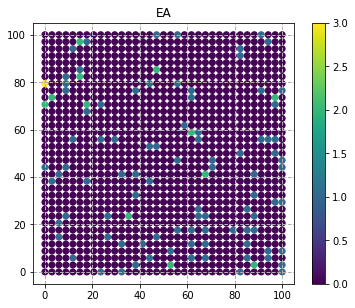

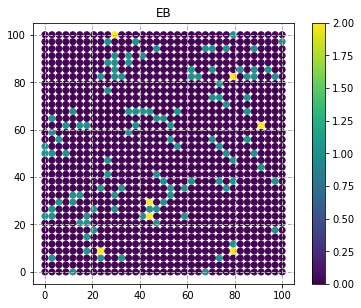

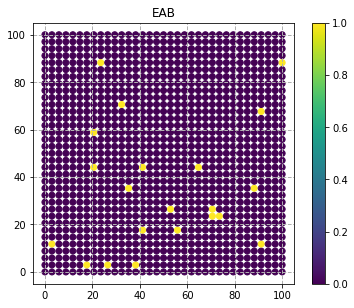

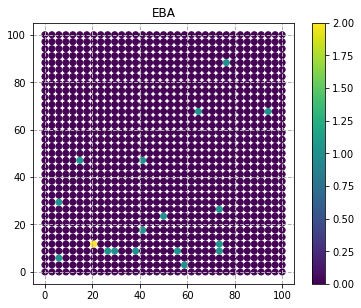

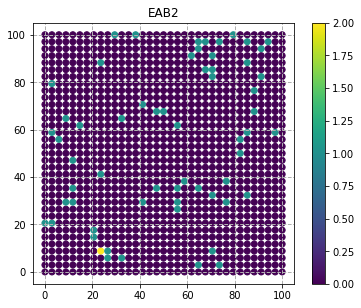

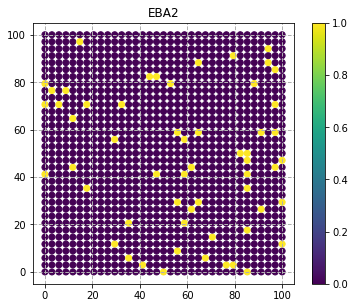

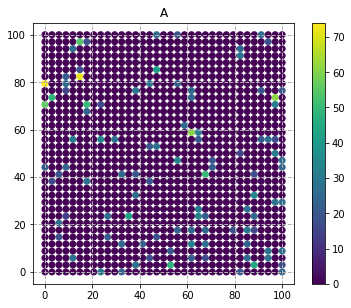

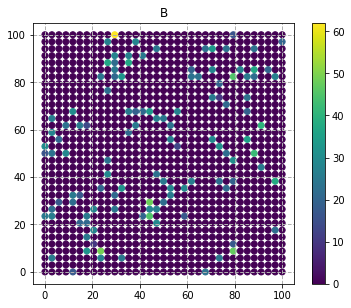

In [7]:
speciesList = model.get_all_species()
for s in speciesList:
    result.plot_species(s, title=s, t_ndx=-1, use_matplotlib=True,)